In [2]:
import os
import numpy as np
import cv2
import tensorflow as tf
from tensorflow import keras
import warnings
from IPython.display import Audio
import librosa

warnings.filterwarnings('ignore')

from matplotlib import pyplot as plt

model= keras.models.load_model("my_separator_model_prototype.keras")
img_size = 128
dataset = os.listdir("music_dataset_spectro_full_single/train") #use as labels
labels = dataset
print(labels)
sr=22050

['Accordion', 'Acoustic_Guitar', 'Banjo', 'Bass_Guitar', 'Clarinet', 'cowbell', 'Dobro', 'Drum_set', 'Electric_Guitar', 'flute', 'Harmonium', 'Horn', 'Keyboard', 'Mandolin', 'Organ', 'Piano', 'Saxophone', 'Shakers', 'Tambourine', 'Trombone', 'Trumpet', 'Ukulele', 'vibraphone', 'Violin']


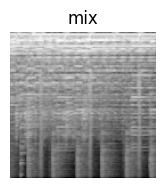

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


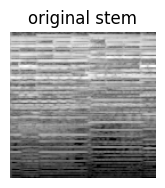

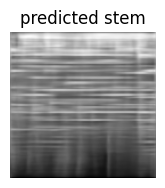

with phase prediction


with original phase


In [11]:
#separte an accordian is combined with bass

img = cv2.imread("Music_separation_dataset_large/test/mix/4048_mix.png",0)
img1 = cv2.imread("Music_separation_dataset_large/test/stems/4048_Accordion.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/4048_mix.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/stems/4048_Accordion.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/4048_mix.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))


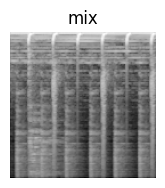

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


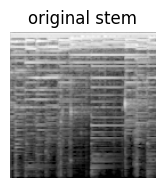

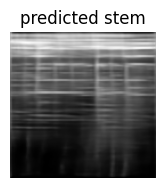

with phase prediction


with original phase


In [10]:
#separte an acoustic guitar is combined with flute and shakers

img = cv2.imread("Music_separation_dataset_large/test/mix/4052_mix.png",0)
img1 = cv2.imread("Music_separation_dataset_large/test/stems/4052_Acoustic_Guitar.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/4052_mix.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/stems/4052_Acoustic_Guitar.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/4052_mix.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

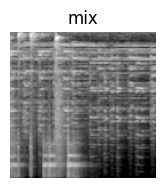

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


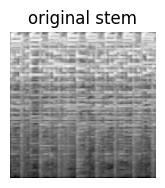

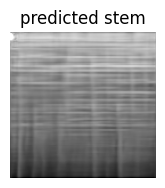

with phase prediction


with original phase


In [9]:
#separte an banjo is combined with drumset

img = cv2.imread("Music_separation_dataset_large/test/mix/4044_mix.png",0)
img1 = cv2.imread("Music_separation_dataset_large/test/stems/4044_Banjo.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/4044_mix.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/stems/4044_Banjo.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/4044_mix.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))


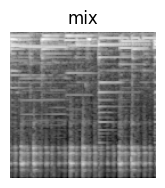

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


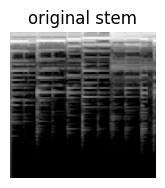

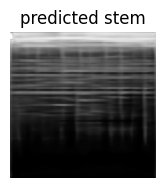

with phase prediction


with original phase


In [12]:
#separte an bass guitar is combined with trumpet ,cowbell and drumset

img = cv2.imread("Music_separation_dataset_large/test/mix/4038_mix.png",0)
img1 = cv2.imread("Music_separation_dataset_large/test/stems/4038_Bass_Guitar.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/4038_mix.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/stems/4038_Bass_Guitar.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/4038_mix.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

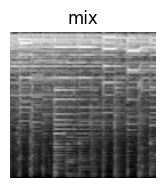

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


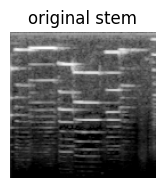

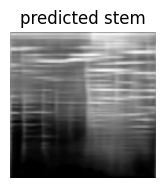

with phase prediction


with original phase


In [13]:
#separating a clarinet from piano and trumpet
img = cv2.imread("Music_separation_dataset_large/test/mix/4503_mix.png",0)
img1 = cv2.imread("Music_separation_dataset_large/test/stems/4503_Clarinet.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/4503_mix.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/stems/4503_Clarinet.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/4503_mix.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))


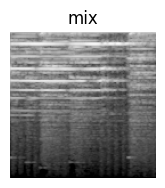

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


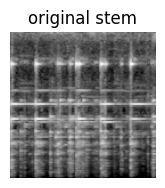

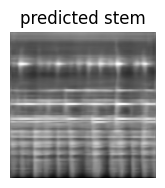

with phase prediction


with original phase


In [14]:
#separte an cowbell is combined with dobro and bass guitar

img = cv2.imread("Music_separation_dataset_large/test/mix/4063_mix.png",0)
img1 = cv2.imread("Music_separation_dataset_large/test/stems/4063_cowbell.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/4063_mix.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,0,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/stems/4063_cowbell.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/4063_mix.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

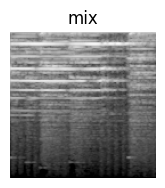

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


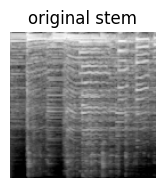

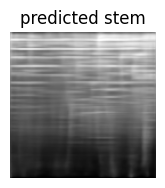

with phase prediction


with original phase


In [17]:
#separating a dobro from bass and cowbell
img = cv2.imread("Music_separation_dataset_large/test/mix/4063_mix.png",0)
img1 = cv2.imread("Music_separation_dataset_large/test/stems/4063_Dobro.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/4063_mix.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/stems/4063_Dobro.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/4063_mix.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))


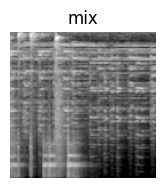

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


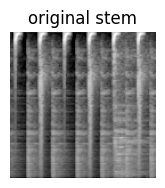

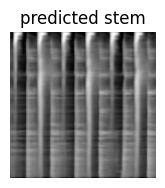

with phase prediction


with original phase


In [18]:
#separte a drumset is combined with banjo

img = cv2.imread("Music_separation_dataset_large/test/mix/4044_mix.png",0)
img1 = cv2.imread("Music_separation_dataset_large/test/stems/4044_Drum_set.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/4044_mix.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,0,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/stems/4044_Drum_set.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/4044_mix.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

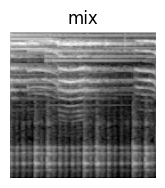

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


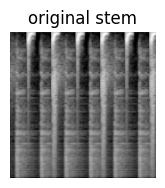

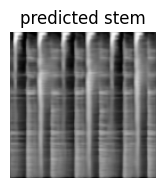

with phase prediction


with original phase


In [19]:
#separte a drumset from saxophone,and acoustic guitar

img = cv2.imread("Music_separation_dataset_large/test/mix/4071_mix.png",0)
img1 = cv2.imread("Music_separation_dataset_large/test/stems/4071_Drum_set.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/4071_mix.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,0,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/stems/4071_Drum_set.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/4071_mix.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

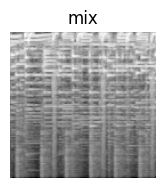

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


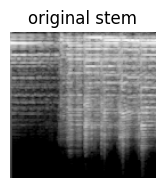

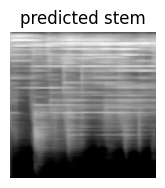

with phase prediction


with original phase


In [ ]:
#separte a eletric guitar from ukulele

img = cv2.imread("Music_separation_dataset_large/test/mix/4040_mix.png",0)
img1 = cv2.imread("Music_separation_dataset_large/test/stems/4040_Electric_Guitar.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/4040_mix.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,0,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/stems/4040_Electric_Guitar.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/4040_mix.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

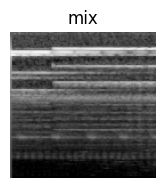

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


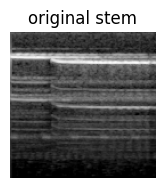

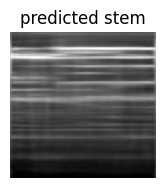

with phase prediction


with original phase


In [ ]:
#separte a flute from trombone

img = cv2.imread("Music_separation_dataset_large/test/mix/4042_mix.png",0)
img1 = cv2.imread("Music_separation_dataset_large/test/stems/4042_flute.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/4042_mix.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,0,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/stems/4042_flute.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/4042_mix.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

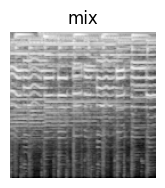

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


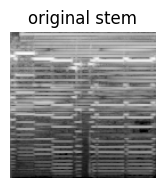

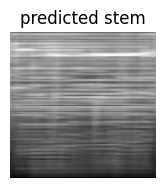

with phase prediction


with original phase


In [21]:
#separte a harmonium from trumpet and vibraphone
img = cv2.imread("Music_separation_dataset_large/test/mix/4037_mix.png",0)
img1 = cv2.imread("Music_separation_dataset_large/test/stems/4037_Harmonium.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/4037_mix.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,0,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/stems/4037_Harmonium.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/4037_mix.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

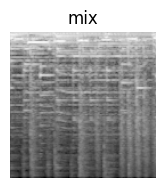

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


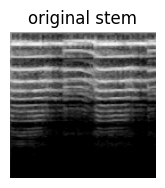

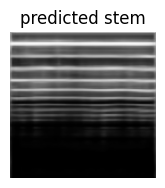

with phase prediction


with original phase


In [22]:
#separte a horn from organ and trombone

img = cv2.imread("Music_separation_dataset_large/test/mix/4049_mix.png",0)
img1 = cv2.imread("Music_separation_dataset_large/test/stems/4049_Horn.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/4049_mix.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,0,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/stems/4049_Horn.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/4049_mix.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

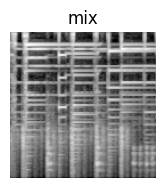

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


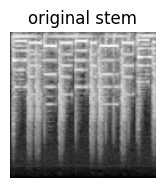

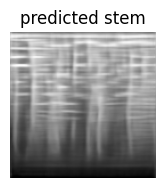

with phase prediction


with original phase


In [23]:
#separte a keyboard from clarinet

img = cv2.imread("Music_separation_dataset_large/test/mix/4041_mix.png",0)
img1 = cv2.imread("Music_separation_dataset_large/test/stems/4041_Keyboard.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/4041_mix.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,0,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/stems/4041_Keyboard.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/4041_mix.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

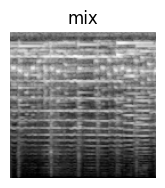

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


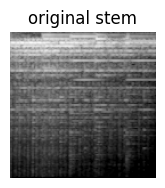

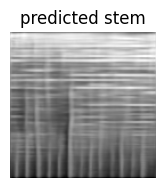

with phase prediction


with original phase


In [24]:
#separte a mandolin from saxophone, and shakers

img = cv2.imread("Music_separation_dataset_large/test/mix/4039_mix.png",0)
img1 = cv2.imread("Music_separation_dataset_large/test/stems/4039_Mandolin.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/4039_mix.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,1,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/stems/4039_Mandolin.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/4039_mix.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

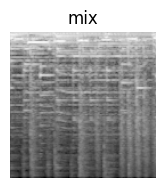

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


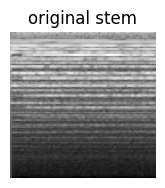

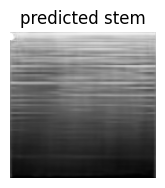

with phase prediction


with original phase


In [25]:
#separte a organ from  horn and trombone

img = cv2.imread("Music_separation_dataset_large/test/mix/4049_mix.png",0)
img1 = cv2.imread("Music_separation_dataset_large/test/stems/4049_Organ.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/4049_mix.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,1,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/stems/4049_Organ.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/4049_mix.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

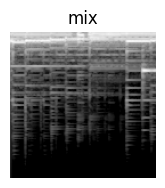

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


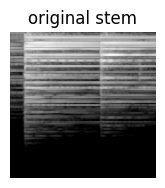

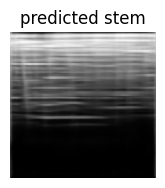

with phase prediction


with original phase


In [26]:
#separte a piano from harmonium

img = cv2.imread("Music_separation_dataset_large/test/mix/4054_mix.png",0)
img1 = cv2.imread("Music_separation_dataset_large/test/stems/4054_Piano.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/4054_mix.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,1,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/stems/4054_Piano.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/4054_mix.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

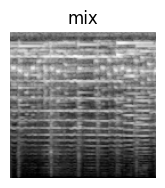

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


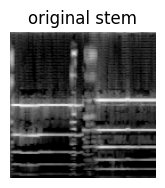

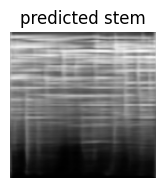

with phase prediction


with original phase


In [ ]:
#separte a saxophone from shakers and mondolin

img = cv2.imread("Music_separation_dataset_large/test/mix/4039_mix.png",0)
img1 = cv2.imread("Music_separation_dataset_large/test/stems/4039_Saxophone.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/4039_mix.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,0,1,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/stems/4039_Saxophone.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/4039_mix.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

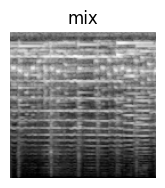

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


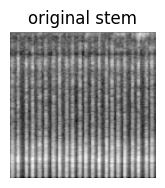

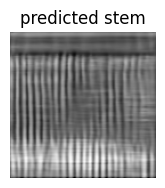

with phase prediction


with original phase


In [28]:
#separte a shakers from saxophone, and mandolin

img = cv2.imread("Music_separation_dataset_large/test/mix/4039_mix.png",0)
img1 = cv2.imread("Music_separation_dataset_large/test/stems/4039_Shakers.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/4039_mix.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,0,0,1,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/stems/4039_Shakers.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/4039_mix.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

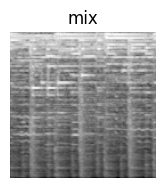

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


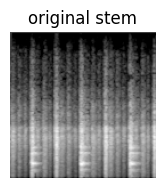

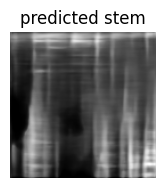

with phase prediction


with original phase


In [29]:
#separte a tambourine from drum set, and piano

img = cv2.imread("Music_separation_dataset_large/test/mix/4055_mix.png",0)
img1 = cv2.imread("Music_separation_dataset_large/test/stems/4055_Tambourine.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/4055_mix.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,0,0,0,1,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/stems/4055_Tambourine.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/4055_mix.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

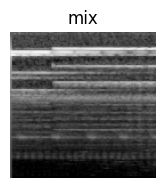

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


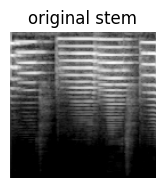

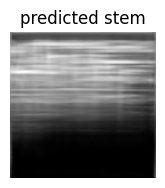

with phase prediction


with original phase


In [30]:
#separte a trombone from flute, and clarinet

img = cv2.imread("Music_separation_dataset_large/test/mix/4042_mix.png",0)
img1 = cv2.imread("Music_separation_dataset_large/test/stems/4042_Trombone.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/4042_mix.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,0,0,0,0,1,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/stems/4042_Trombone.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/4042_mix.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

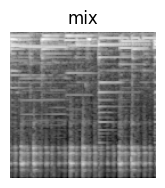

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


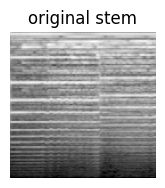

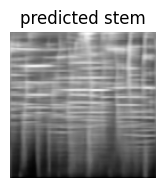

with phase prediction


with original phase


In [32]:
#separte a trumpet from harmonium and vibraphone

img = cv2.imread("Music_separation_dataset_large/test/mix/4038_mix.png",0)
img1 = cv2.imread("Music_separation_dataset_large/test/stems/4038_Trumpet.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/4038_mix.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,0,0,0,0,0,1,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/stems/4038_Trumpet.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/4038_mix.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

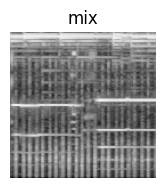

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


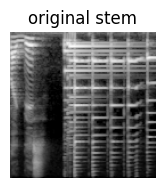

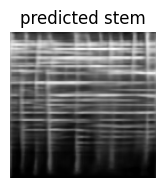

with phase prediction


with original phase


In [33]:
#separte a ukuele from  eletric guitar

img = cv2.imread("Music_separation_dataset_large/test/mix/4040_mix.png",0)
img1 = cv2.imread("Music_separation_dataset_large/test/stems/4040_Ukulele.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/4040_mix.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,0,0,0,0,0,0,1,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/stems/4040_Ukulele.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/4040_mix.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

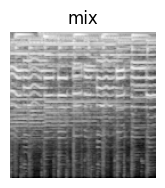

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


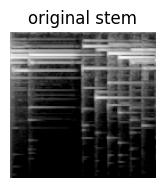

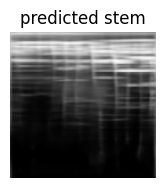

with phase prediction


with original phase


In [34]:
#separte a vibraphone from harmonium and trumpet

img = cv2.imread("Music_separation_dataset_large/test/mix/4037_mix.png",0)
img1 = cv2.imread("Music_separation_dataset_large/test/stems/4037_vibraphone.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/4037_mix.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,0,0,0,0,0,0,0,1,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/stems/4037_vibraphone.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/4037_mix.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

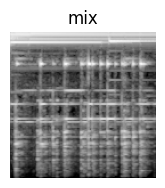

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


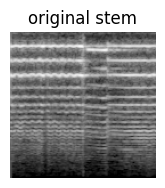

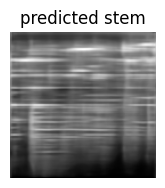

with phase prediction


with original phase


In [36]:
#separte a violin from trumpet ,and flute

img = cv2.imread("Music_separation_dataset_large/test/mix/4056_mix.png",0)
img1 = cv2.imread("Music_separation_dataset_large/test/stems/4056_Violin.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/4056_mix.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,0,0,0,0,0,0,0,0,1]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/stems/4056_Violin.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/4056_mix.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))